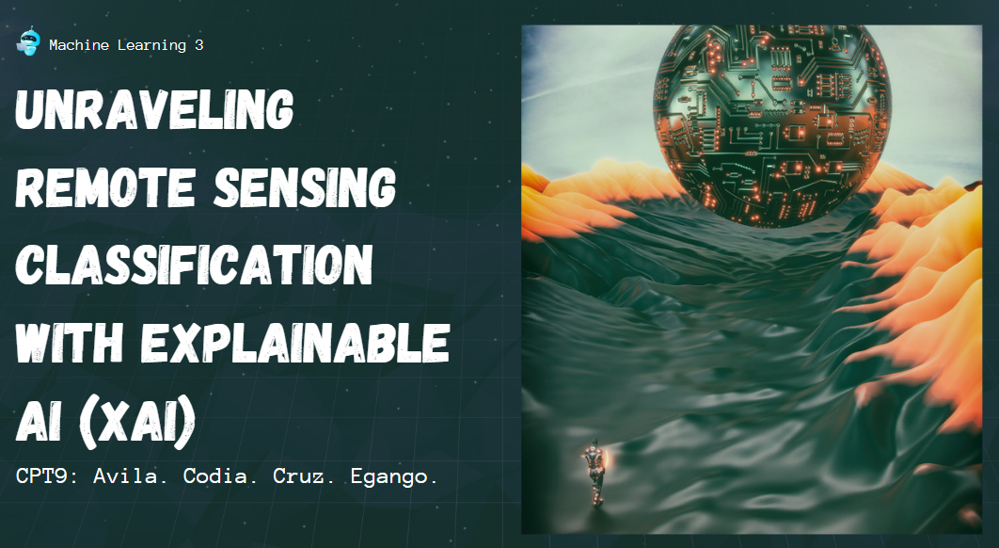

# Introduction

Convolutional Neural Networks (CNNs) are powerful and widely used deep learning architectures for image classification and computer vision. They learn hierarchical representations from raw pixel data, revolutionizing the field with remarkable performance. However, as CNNs become more complex, their inner workings become less transparent, limiting interpretability and raising concerns about reliability, fairness, and biases.

To address these challenges, researchers focus on model explainability to understand CNN decision-making. In this article, we explore model explainability in remote sensing classification, specifically for aerial scenic images. We employ ResNet-34, a suitable CNN architecture known for excellent performance and deeper network structures.

To uncover the underlying patterns in ResNet-34, we use the Local Interpretable Model-agnostic Explanations (LIME) technique. LIME generates local explanations to identify significant image regions in the decision-making process.

We implement ResNet-34 and LIME using PyTorch, a user-friendly deep-learning framework. PyTorch offers a comprehensive ecosystem for building, training, and evaluating CNN models.

Our aim is to demystify our proposed deep learning model, enabling accurate and transparent image classification for remote sensing practitioners. Understanding factors that drive ResNet-34 predictions with LIME enhances model reliability and fairness, empowering practitioners to tackle global challenges such as climate change monitoring, disaster response, and sustainable development.

Through our model, which we named “Superpixel Insights for Aerial Image Classification” or SIFAIC, we bridge the gap between complex CNNs, interpretability with LIME, and the ease of use provided by PyTorch. This tutorial may serve as a vital resource, enabling practitioners to make informed decisions and contribute to global efforts in addressing climate change.

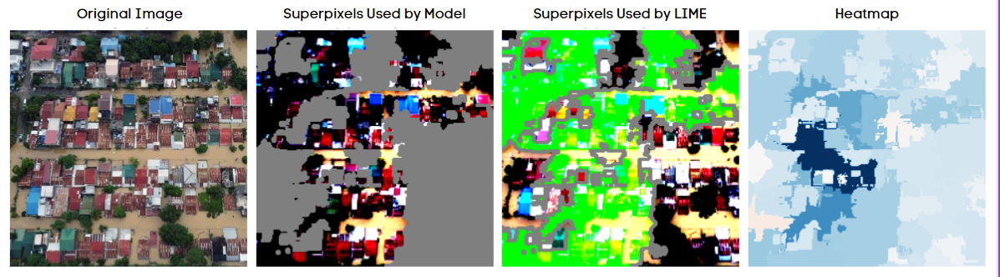

**<center>Explaining Image Classification Using LIME</center>**

# Configuring the Necessary Python Packages

Make sure to set the environment variables to specify cache directories. In the case where this notebook is run, this is required. This is necessary in situations where you want to customize the location where libraries or frameworks store their cache data. Cache data typically includes temporary files, downloaded files, or any other data that is stored locally for faster access in subsequent operations.

By setting the environment variables, you can override the default cache directory paths and specify a different location that suits your requirements. Take note that path varies depending on the type of environment and setup where your notebook will be run.

In [1]:
import os

# Set the environment variables to specify the cache directories
# for different libraries or frameworks.
os.environ['XDG_CACHE_HOME'] = '/home/msds2023/javila/.cache'
os.environ['HUGGINGFACE_HUB_CACHE'] = '/home/msds2023/javila/.cache'
os.environ['TRANSFORMERS_CACHE'] = '/home/msds2023/javila/.cache'

We need to ensure that we have all of the necessary packages installed. Install the necessary packages by running this line of code in your Jupyter Notebook:

```python
!pip install --upgrade pandas numpy matplotlib tensorflow torch torchvision lime
```

Once the installation is finished, you can proceed with importing the required libraries in your code. Make sure to include the following import statements at the beginning of your code:

In [2]:
import PIL
from PIL import Image
import os, shutil
import numpy as np
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
import copy
import time

import torch
import torchvision
from torchvision.utils import save_image
from torchvision.transforms.functional import to_tensor
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch import nn, optim
from torchsummary import summary

import lime
from lime import lime_image

Check if you have a GPU and save whatever your device is using in 'device' parameter. The model here was run in Cuda which is a lot better in terms of speed.

In [3]:
# Hoping there is a GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Data Preparation and Pre-processing

The dataset used here is an aerial scene image dataset taken from the paper entitled "AID: A Benchmark Dataset for Performance Evaluation of Aerial Scene Classification" and can be downloaded from https://www.kaggle.com/datasets/jiayuanchengala/aid-scene-classification-datasets. The AID dataset has 30 different scene classes and about 200 to 400 samples of size 600x600 in each class. These images were gathered by collecting sample images from Google Earth imagery.

The codes used here were adopted from the notebook of Ms. Mia Desiree Verdeprado in her class for Machine Learning 3 for MSDS 2023. The main purpose of the code is to partition the dataset into train, validation, and test sets. The partitioned dataset are saved in their corresponding folders for training, validation, and testing.

Data augmentation techniques are applied to the training data. Data augmentation involves applying various transformations or modifications to the input images, creating new versions of the images with different appearances. These transformations can include rotation, scaling, cropping, flipping, and adjusting brightness or contrast, among others.

The purpose of data augmentation is to increase the diversity and variability of the training data. By presenting the model with augmented images, it helps the model to learn more robust and generalized features, making it less sensitive to variations in the input data. This improves the model's ability to generalize well to unseen or slightly different images during inference or evaluation.

In [4]:
def list_files(path):
    """
    Gets the list of folders or files in a directory
    without including the hidden files.
    """
    # Do not include hidden files
    files = [f for f in os.listdir(path) if not f.startswith('.')]
    return files

In [5]:
# This function can be used to copy images to train, validation, and test dirs
def create_dataset(src, dst, range_, class_):
    """Copy images of class class_ within range_ from src to dst.
    
    Parameters
    ----------
    src : str
        source directory
    dst : str
        destination directory
    range_ : tuple
        tuple of min and max image index to copy
    class_ : str
        image class 
    """
    if os.path.exists(dst):
        # if existing, delete dir to reset
        shutil.rmtree(dst)
    os.makedirs(dst)
    fnames_list = list_files(src)
    fnames = [fnames_list[i] for i in range(*range_)]
    for fname in fnames:
        src_file = os.path.join(src, fname)
        dst_file = os.path.join(dst, fname)
        shutil.copyfile(src_file, dst_file)

'path_raw' is the file directory from which the dataset was saved from. In this file path, images are contained in folders with their corresponding class name. On the other hand, 'path_output' is the destination file path within which the test, validation, and training datasets will be partitioned and saved into.

In [6]:
path_raw = "AID/images"
path_output = "AID"

The next code snippet divides the raw dataset into 60% training data, 20% validation data, and 20% test data.

In [7]:
import math

# looping through create_dataset for each class
# Partition should be as follows
# 60% train data, 20% validation data, 20% test data
classes = sorted(list_files(path_raw))
for class_ in classes:
    src = path_raw # source file
    total_photos = len(list_files(f"{path_raw}/{class_}"))
    
    train_set = math.ceil(total_photos*0.6)
    val_set = int((total_photos -  train_set)*0.5)
    test_set = int(total_photos -  train_set - val_set)
    
    dst = f'{path_output}/dataset/train/{class_}' # train
    create_dataset(src+'/'+class_, dst, range_=(1, train_set+1), class_=class_)

    dst = f'{path_output}/dataset/validation/{class_}' # val
    create_dataset(src+'/'+class_, dst, range_=(train_set+1, train_set+val_set+1), class_=class_)
    
    dst = f'{path_output}/dataset/test/{class_}' # test
    create_dataset(src+'/'+class_, dst, range_=(train_set+val_set+1, total_photos), class_=class_)

We have to check if correct number of images are saved to the necessary folders. We can do this by counting the saved images in each dataset file path for each class.

In [7]:
# Checking of the number of files in each folder
path_dataset = f"{path_output}/dataset"
for data in list_files(path_dataset):
    path_data = f"{path_dataset}/{data}"
    for class_ in list_files(path_data):
        path_class = f"{path_dataset}/{data}/{class_}"
        print(f"total {data} {class_} images:", len(list_files(path_class)))

total train Airport images: 216
total train BareLand images: 186
total train BaseballField images: 132
total train Beach images: 240
total train Bridge images: 216
total train Center images: 156
total train Church images: 144
total train Commercial images: 210
total train DenseResidential images: 246
total train Desert images: 180
total train Farmland images: 222
total train Forest images: 150
total train Industrial images: 234
total train Meadow images: 168
total train MediumResidential images: 174
total train Mountain images: 204
total train Park images: 210
total train Parking images: 234
total train Playground images: 222
total train Pond images: 252
total train Port images: 228
total train RailwayStation images: 156
total train Resort images: 174
total train River images: 246
total train School images: 180
total train SparseResidential images: 180
total train Square images: 198
total train Stadium images: 174
total train StorageTanks images: 216
total train Viaduct images: 252
tot

All 30 aerial scene classes available in the raw dataset were used. The following list shows these 30 classes.

In [28]:
path_test = f"{path_output}/dataset/test"
classes = list_files(path_test)
classes

['Airport',
 'BareLand',
 'BaseballField',
 'Beach',
 'Bridge',
 'Center',
 'Church',
 'Commercial',
 'DenseResidential',
 'Desert',
 'Farmland',
 'Forest',
 'Industrial',
 'Meadow',
 'MediumResidential',
 'Mountain',
 'Park',
 'Parking',
 'Playground',
 'Pond',
 'Port',
 'RailwayStation',
 'Resort',
 'River',
 'School',
 'SparseResidential',
 'Square',
 'Stadium',
 'StorageTanks',
 'Viaduct']

For sanity check, we will display a few photos in the test dataset with their corresponding class name.

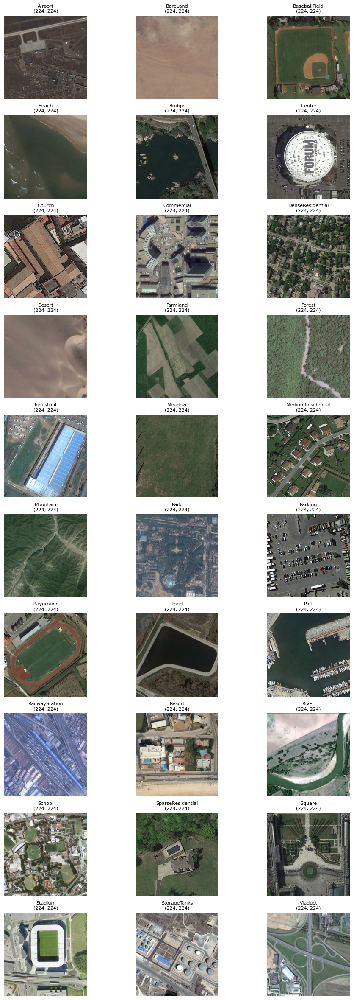

In [9]:
import math

# Define directory for test data
path_test = f"{path_output}/dataset/test"

# Loop into each class
img_list = []
class_list = []
for i, class_ in enumerate(list_files(path_test)):
    path_class = f"{path_test}/{class_}"
    path_img = f"{path_class}/{list_files(path_class)[0]}"
    img = Image.open(path_img)
    compressed_img = img.resize((224, 224))  # Compress image to desired size
    img_list.append(compressed_img)
    class_list.append(class_)

# Determine the number of images
num_images = len(img_list)

# Calculate the number of rows and columns for the subplot grid
num_cols = min(num_images, 3)
num_rows = math.ceil(num_images / num_cols)

# Adjust the aspect ratio of subplots for reduced horizontal spacing
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, num_rows*3))

# Iterate through each image and its corresponding class
for i, (img, class_name) in enumerate(zip(img_list, class_list)):
    # Calculate the current row and column index for the subplot
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Plot the image
    ax = axs[row_idx, col_idx] if num_rows > 1 else axs[col_idx]
    ax.imshow(img)
    ax.axis('off')

    # Set the title as the corresponding class
    ax.set_title(f"{class_name}\n{img.size}", fontsize=8)  # Adjust the fontsize as needed

# Remove empty subplots if the number of images is not a multiple of num_cols
if num_images % num_cols != 0:
    for i in range(num_images, num_rows * num_cols):
        ax = axs.flatten()[i]
        ax.axis('off')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.004, hspace=0.2)

# Show the plot
plt.show()


The following code snippet sets up the training dataset by loading the images, applying transformations, and computing the means and standard deviations for normalization. It ensures that the images are properly prepared and ready to be fed into a deep learning model for training.

In [10]:
# Set the directory path for the training dataset
train_dir = f"{path_output}/dataset/train"

# Define the transformations to be applied to the dataset
data_transforms = transforms.Compose([
    transforms.Resize(size=(224, 224)),  # Resize the images to the specified size
    transforms.ToTensor()  # Convert the images to tensors
])

# Load the training dataset using the specified transformations
train_data = datasets.ImageFolder(root=train_dir, transform=data_transforms)

# Compute the means and standard deviations for normalization
# Stack all the images in the dataset into a tensor
imgs = torch.stack([img_t for img_t, _ in train_data], dim=3)

# Calculate the means for each channel (dimension) of the images
means = imgs.view(3, -1).mean(dim=1).numpy()

# Calculate the standard deviations for each channel (dimension) of the images
stds = imgs.view(3, -1).std(dim=1).numpy()

# Print the computed means and standard deviations
print(f'Means:           {means}')
print(f'Std. Deviations: {stds}')

Means:           [0.3993528  0.4104297  0.36928317]
Std. Deviations: [0.20810837 0.18451604 0.18224896]


This part of the pipeline prepares training images by resizing them, introducing random variations in orientation and perspective, adjusting the color, and finally converting them to tensors and normalizing the pixel values. These steps help to improve the model's ability to learn from diverse and augmented training data, leading to better generalization and performance on unseen images.

In [11]:
# Define the transformations to be applied to the training, validation, and test data
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.RandomHorizontalFlip(p=0.6),  # Apply random horizontal flipping with a probability of 0.6
        transforms.RandomPerspective(p=0.5),  # Apply random perspective transformation with a probability of 0.5
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),  # Adjust color jitter with specified parameters
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ]),
    'validation': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ]),
    'test': transforms.Compose([
        transforms.Resize(size=(224,224)),  # Resize the images to (224, 224)
        transforms.ToTensor(),  # Convert the images to tensors
        transforms.Normalize(means, stds)  # Normalize the images using the specified means and standard deviations
    ])
}

# Set the directory path for the dataset
data_dir = f"{path_output}/dataset/"

# Load the image data using the ImageFolder dataset class
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'validation', 'test']}

# Create dataloaders for each data split (train, validation, test)
dataloaders = {x: DataLoader(image_datasets[x], batch_size=4, shuffle=True) for x in ['train', 'validation', 'test']}

# Calculate the size of each dataset (train, validation, test)
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get the class names from the 'train' dataset
class_names = image_datasets['train'].classes

Each step in the data augmentation process implemented in the previous cell is plotted and briefly described here.

In [213]:
from pathlib import Path

# for plotting transforms
plt.rcParams["savefig.bbox"] = 'tight'
img_class = f"AID/dataset/test/Airport"
image_path = f"{img_class}/{list_files(img_class)[8]}"
orig_img = Image.open(Path(image_path))

def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):
    """
    Plots a grid of images, with optional original image and row titles.

    Args:
        imgs (list[list]): A 2D list of images to plot.
        with_orig (bool, optional): Whether to include the original image
        in the grid. Default is True.
        row_title (list[str], optional): A list of titles for each row.
        Default is None.
        **imshow_kwargs: Additional keyword arguments to pass to
        `imshow` function.

    Returns:
        None
    """
    if not isinstance(imgs[0], list):
        # make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

The code below resizes an original image (orig_img) to different dimensions (30, 50, 100, and the original size) using transforms.Resize. The resized images are stored in resized_imgs. They are then plotted using a custom plot function for visual comparison.

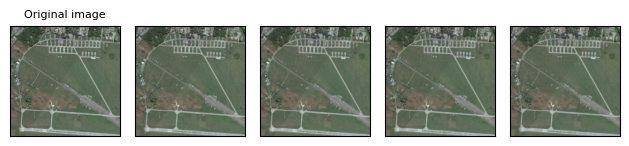

In [214]:
resized_imgs = [transforms.Resize(size=(224,224))(orig_img) for size in (30, 50, 100, orig_img.size)]
plot(resized_imgs)

The code below applies random horizontal flipping (transforms.RandomHorizontalFlip) to an original image (orig_img) with a probability of 0.6. It generates four transformed images (transformed_imgs) by repeatedly applying the horizontal flip transformation. The resulting images are then plotted using a custom plot function for visualization.

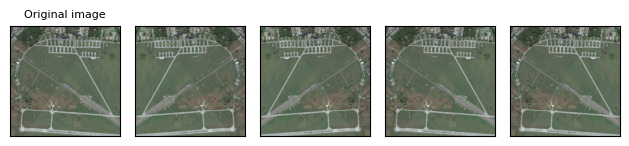

In [215]:
hflipper = transforms.RandomHorizontalFlip(p=0.6)
transformed_imgs = [hflipper(orig_img) for _ in range(4)]
plot(transformed_imgs)

The code below applies random perspective transformation (transforms.RandomPerspective) to an original image (orig_img) with a probability of 0.5. It generates four transformed images (transformed_imgs) by repeatedly applying the perspective transformation. The resulting images are then plotted using a custom plot function for visualization.

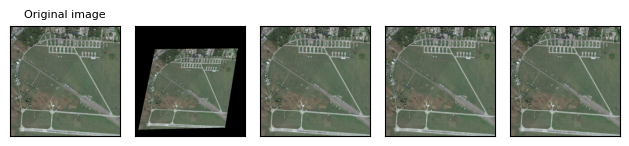

In [216]:
perspective = transforms.RandomPerspective(p=0.5)
transformed_imgs = [perspective(orig_img) for _ in range(4)]
plot(transformed_imgs)

The code below uses color jitter transformation (transforms.ColorJitter) to introduce random variations in brightness, contrast, saturation, and hue to an original image (orig_img). It creates four transformed images (transformed_imgs) by repeatedly applying the color jitter transformation. The resulting images are then plotted using a custom plot function for visualization.

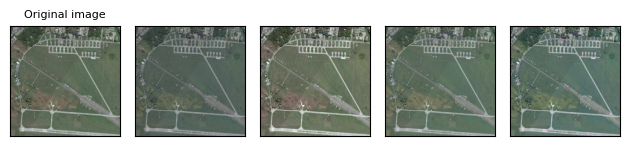

In [217]:
jitter = transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2)
transformed_imgs = [jitter(orig_img) for _ in range(4)]
plot(transformed_imgs)

# Model Training, Validation, and Testing

After the dataset is partitioned, transformed, and loaded, we will now prepare the code for training and validating the model. In this case, the type of CNN model to be used is a RESNET-34 model.

ResNet-34 is a state-of-the-art CNN with 34 layers, known for its strong performance in image classification. ResNet-34 has undergone pre-training on the expansive ImageNet dataset, which encompasses over 100,000 images distributed across a diverse range of 200 distinct classes. It utilizes residual connections to train deep networks effectively. ResNet-34 strikes a balance between model complexity and efficiency, making it popular for various computer vision tasks. It consists of multiple stages with residual blocks, gradually capturing complex features. ResNet-34 has achieved excellent results on ImageNet and is widely used for transfer learning. Its residual connections enable training deep networks and have influenced subsequent advancements in CNN architectures.

## Model Training

In the training process for the aerial scene classification application described here, modifications are made to the classifier layers of the ResNet-34 model. The original fully connected layer is replaced with a new sequential architecture, consisting of a linear layer with 512 input features, followed by a ReLU activation function, a dropout layer with a rate of 0.4, and another linear layer to match the number of output classes.

Next, specific parameters are selected for fine-tuning. The names of the desired parameters are stored in a list called "params_to_update". By iterating through the named parameters of the model, if a parameter matches any of the names in "params_to_update", it is set to require gradients for optimization, and the parameter is added to the "params" list.

Additionally, the last fully connected layer is replaced once again to ensure it matches the number of output classes. The entire model is then transferred to the designated device, such as a GPU, if available, using the "to()" method.

A cross-entropy loss function is chosen as the criterion for optimization. The parameters of the last convolutional block and the classifier are optimized using the Adam optimizer with a learning rate of 0.0002.

Finally, the model is trained using the "train_model" function for a specified number of epochs, which in this case is set to 10. The training involves iteratively updating the model's parameters based on the calculated loss, optimizing the model towards achieving better performance on the given task. Training time took around 4 hours.

In [17]:
def train_model(model, criterion, optimizer, num_epochs=25):
    """
    Train the model with the given criterion and optimizer for a
    specified number of epochs.

    Args:
        model (torch.nn.Module): The model to be trained.
        criterion (torch.nn.Module): The loss function to optimize.
        optimizer (torch.optim.Optimizer): The optimizer for updating
        model parameters.
        num_epochs (int, optional): The number of training epochs.
        Defaults to 25.

    Returns:
        torch.nn.Module: The trained model.

    """
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
           
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [18]:
# Load pre-trained ResNet34 model
model =  torchvision.models.resnet34(weights='IMAGENET1K_V1')

In [19]:
num_classes = len(class_names)

# Modify the classifier layers
num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_features, 512),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(512, num_classes)
)

# Setting parameters to fine-tune
params_to_update = ['layer4.0.conv1.weight', 'layer4.0.conv1.bias',
                    'layer4.0.conv2.weight', 'layer4.0.conv2.bias',
                    'layer4.1.conv1.weight', 'layer4.1.conv1.bias',
                    'layer4.1.conv2.weight', 'layer4.1.conv2.bias',
                    'fc.weight', 'fc.bias']

# Store parameters in a list
params = []
for name, param in model.named_parameters():
    for parameter in params_to_update:
        if parameter in name:
            param.requires_grad = True
            params.append(param)

# Replace last fully connected layer to match the number of output classes
model.fc = nn.Linear(512, num_classes)

In [20]:
model = model.to(device)

# set the loss function
criterion = nn.CrossEntropyLoss()

# the parameters of the last concolutional block and classifier are being optimized
optimizer_model = optim.Adam(params, lr=0.0002)

In [29]:
model = train_model(model, 
                    criterion, 
                    optimizer_model, 
                    num_epochs=10)

Epoch 0/9
----------
train Loss: 1.0458 Acc: 0.8022
validation Loss: 0.3723 Acc: 0.8975

Epoch 1/9
----------
train Loss: 0.7849 Acc: 0.8362
validation Loss: 0.3145 Acc: 0.9160

Epoch 2/9
----------
train Loss: 0.7136 Acc: 0.8492
validation Loss: 0.3249 Acc: 0.9165

Epoch 3/9
----------
train Loss: 0.6389 Acc: 0.8655
validation Loss: 0.3535 Acc: 0.9085

Epoch 4/9
----------
train Loss: 0.5906 Acc: 0.8772
validation Loss: 0.3153 Acc: 0.9155

Epoch 5/9
----------
train Loss: 0.5536 Acc: 0.8838
validation Loss: 0.2980 Acc: 0.9185

Epoch 6/9
----------
train Loss: 0.5308 Acc: 0.8940
validation Loss: 0.3264 Acc: 0.9175

Epoch 7/9
----------
train Loss: 0.4989 Acc: 0.9005
validation Loss: 0.2945 Acc: 0.9290

Epoch 8/9
----------
train Loss: 0.4860 Acc: 0.9007
validation Loss: 0.2797 Acc: 0.9235

Epoch 9/9
----------
train Loss: 0.4386 Acc: 0.9118
validation Loss: 0.3131 Acc: 0.9230

Training complete in 262m 25s
Best val Acc: 0.929000


## Saving the Trained Model

To avoid the need to re-run the training process for evaluation and inference, it is beneficial to save the trained model. This way, we can load the model later and use it directly without repeating the training steps.

In [31]:
PATH = "SIFAIC.pth"
torch.save(model.state_dict(), PATH)

The following code snippet loads the saved trained model.

In [21]:
# Load the saved model weights
model.load_state_dict(torch.load('SIFAIC.pth'))
model = model.to(device)
model.eval()  # Set the model to evaluation mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## Model Evaluation

Our Resnet-34 model showed a very good accuracy. This high accuracy is also a requirement when extracting valuable information from the explainability of the model. A low model accuracy will result to unreliable insights when we use LIME later on.

In the code snippet below, we define a function called "evaluate" that allows us to assess the performance of a trained model on a test dataset. By providing the model and the corresponding test data loader as inputs, we can easily evaluate the accuracy of the model's predictions.

During evaluation, we initialize counters to keep track of the total number of correct predictions and the overall number of examples. Using the torch.no_grad() context manager, we iterate over the test loader, which conveniently provides us with batches of test images and their corresponding labels.

To leverage the power of available GPUs, we move the images and labels to the appropriate device using the .to(device) method. By passing the images through the model, we obtain the model's predicted outputs. Taking the argmax of the output scores allows us to determine the predicted labels.

We then update the total count by adding the number of labels in the current batch, while the correct count is incremented by the sum of predictions that match the true labels. Finally, we calculate the test accuracy by dividing the correct count by the total number of examples and display it using the print() function.

With this convenient evaluation function, we can easily assess the performance of our trained model on the test dataset and gain insights into its accuracy.

In [22]:
def evaluate_accuracy(model, test_loader):
    """
    Evaluate the model on the test dataset and print the test accuracy.

    Args:
        model (torch.nn.Module): The trained model to be evaluated.
        test_loader (torch.utils.data.DataLoader): The data loader for
        the test dataset.

    """
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs, dim=1)
            total += labels.shape[0]
            correct += int((predicted == labels).sum())

    print("Test Accuracy: {:.4f}".format(correct / total))

Model test accuracy, recall, precision, and F1 scores are at around 93 % - 94 %.

In [24]:
from sklearn.metrics import precision_score, recall_score, f1_score

def compute_classification_metrics(model, test_loader):
    """
    Evaluate the model on the test dataset and print the test accuracy,
    precision, recall, and F1 score.

    Args:
        model (torch.nn.Module): The trained model to be evaluated.
        test_loader (torch.utils.data.DataLoader): The data loader for
        the test dataset.
    """
    correct = 0
    total = 0
    predicted_labels = []
    true_labels = []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs, dim=1)
            total += labels.shape[0]
            correct += int((predicted == labels).sum())

            predicted_labels.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    accuracy = correct / total
    precision = precision_score(true_labels, predicted_labels, average='weighted')
    recall = recall_score(true_labels, predicted_labels, average='weighted')
    f1 = f1_score(true_labels, predicted_labels, average='weighted')

    print("Test Accuracy: {:.4f}".format(accuracy))
    print("Precision: {:.4f}".format(precision))
    print("Recall: {:.4f}".format(recall))
    print("F1 Score: {:.4f}".format(f1))

In [25]:
compute_classification_metrics(model, dataloaders['test'])

Test Accuracy: 0.9376
Precision: 0.9416
Recall: 0.9376
F1 Score: 0.9377


In [26]:
from sklearn.metrics import classification_report

def get_classification_report(model, test_loader):
    """
    Evaluate the model on the test dataset, print the test accuracy,
    and generate the classification report.

    Args:
        model (torch.nn.Module): The trained model to be evaluated.
        test_loader (torch.utils.data.DataLoader): The data loader for
        the test dataset.
    """
    correct = 0
    total = 0
    predicted_labels = []
    true_labels = []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs, dim=1)
            total += labels.shape[0]
            correct += int((predicted == labels).sum())
            predicted_labels.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    classification_rep = classification_report(
        true_labels, predicted_labels, target_names=classes
    )
    print("Classification Report:\n", classification_rep)

In [29]:
get_classification_report(model, dataloaders['test'])

Classification Report:
                    precision    recall  f1-score   support

          Airport       0.91      0.97      0.94        71
         BareLand       0.95      0.89      0.92        61
    BaseballField       0.98      1.00      0.99        43
            Beach       0.99      1.00      0.99        79
           Bridge       0.91      0.96      0.93        71
           Center       0.91      0.78      0.84        51
           Church       0.74      0.96      0.83        47
       Commercial       0.91      0.93      0.92        69
 DenseResidential       0.87      0.96      0.91        81
           Desert       0.89      1.00      0.94        59
         Farmland       1.00      0.92      0.96        73
           Forest       1.00      0.98      0.99        49
       Industrial       0.97      0.75      0.85        77
           Meadow       0.95      1.00      0.97        55
MediumResidential       0.96      0.96      0.96        57
         Mountain       1.00   

From the classification report above, we can observe that the classes with lower precision, recall, and F1-score tend to have lower performance compared to other classes. The classes "Center," "Church," "School," and "Resort" have relatively lower scores across these metrics, indicating that the model struggles to accurately predict these classes. These classes may exhibit challenges such as class imbalance, similarity to other classes, or insufficient representation in the training data. Improving the model's performance on these classes could be a focus for further analysis and optimization to enhance the overall classification accuracy.

## Model Testing

To display model testing results, we define two functions: imageshow and visualize_preds.

The imageshow function is used to display an image. It takes an image tensor as input, which should be normalized between -1 and 1. It unnormalizes the image, converts it to a numpy array, and then uses matplotlib to display the image.

The visualize_preds function is used to visualize the predictions made by our trained model on a batch of images. It takes the trained model, a batch of images, and their corresponding labels as input. It displays the batch of images as a single image grid using the imageshow function. It then prints the real labels and the predicted labels for the images using the classes list. The model is used to make predictions on the images, and the predicted labels are displayed.

In [30]:
def imageshow(img):
    """
    Display an image.

    Parameters:
        img (torch.Tensor): The image tensor to be displayed.
        Should be normalized between -1 and 1.

    Returns:
        None
    """
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def visualize_preds(model, images, labels):
    """
    Visualize the predictions made by a model on a batch of images.

    Parameters:
        model (torch.nn.Module): The trained model used for prediction.
        images (torch.Tensor): The input images as a tensor.
        labels (torch.Tensor): The true labels for the images.

    Returns:
        None
    """
    # get batch of images from the test DataLoader  
    images = images.to(device)
    labels = labels.to(device)

    # show all images as one image grid
    imageshow(torchvision.utils.make_grid(images.cpu()))
   
    # show the real labels  
    print('Real labels: ', ' '.join('%5s' % classes[labels[j]] 
                               for j in range(4)))

    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    
    # show the predicted labels 
    print('Predicted: ', ' '.join('%5s' % classes[predicted[j]] 
                              for j in range(4)))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


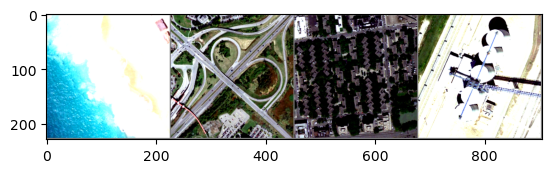

Real labels:  Beach Viaduct DenseResidential StorageTanks
Predicted:  Beach Viaduct DenseResidential StorageTanks


In [31]:
images, labels = next(iter(dataloaders['test']))

visualize_preds(model, images, labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


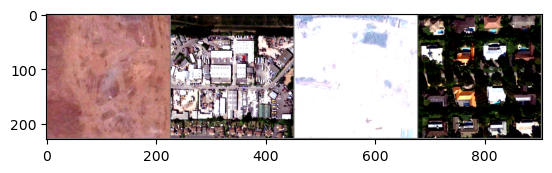

Real labels:  BareLand Industrial BareLand MediumResidential
Predicted:  BareLand Industrial BareLand MediumResidential


In [32]:
images, labels = next(iter(dataloaders['test']))

visualize_preds(model, images, labels)

# Unraveling Model Prediction with LIME

LIME, known as Local Interpretable Model-agnostic Explanations, is a highly favored technique in Explainable AI that aims to gain high-level understanding of the inner workings of deep learning models. It is widely employed for generating interpretable explanations at the local level. LIME is a versatile method that can be used for solving both regression and classification problems, and it is applicable to various types of datasets, including structured data as well as unstructured data such as text and images.

For image classifiers, LIME produces a collection of images by manipulating the input image through the division of interpretable components known as super pixels. This process yields a probability of belonging for each of these modified instances. By analyzing the classification of these perturbed data, LIME generates a visual explanation that highlights a specific region in the input image. This region represents the aspects the model focused on while making its prediction.

If you want to learn more about LIME, you can read more about it in the paper entitled, "'Why Should I Trust You?': Explaining the Predictions of Any Classifier" that can be found in this link: https://arxiv.org/abs/1602.04938

Let us now proceed to getting LIME in action.

From the above preparations, we are now ready to explain our Resnet-34 model above using LIME.

## Explanations Using the Test Dataset

In generating explanations, we will first use an image from the test dataset. In this case, we chose a dense residential area because this is one class of image that is frequently monitored during disasters. We will check how the model is able to distinguish this type of aerial image class.

In [182]:
img_class = f"AID/dataset/test/DenseResidential"
img_fname = f"{img_class}/{list_files(img_class)[1]}"
test_image = Image.open(img_fname)

In here, is a function to extract prediction from the model. The outputs of the function include the image, image class and the probability of the predicted class.

In [77]:
import torch.nn.functional as F

def predict_image(test_image, model, show_image=False):
    """
    Predicts the class of a test image using a trained model and
    optionally displays the image with its predicted class.

    Args:
        test_image (PIL.Image): The test image to predict the class for.
        model (torch.nn.Module): The trained model to use for prediction.
        show_image (bool, optional): Whether to display the test image
        along with its predicted class. Default is False.

    Returns:
        tuple or None: If `show_image` is False, returns a tuple containing
        the predicted class and the probabilities for each class.
        If `show_image` is True, displays the test image with its
        predicted class and returns None.
    """
    # Preprocess the image
    test_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    test_img = test_transform(test_image)
    test_img = test_img.unsqueeze(0)
    with torch.no_grad():
        test_img = test_img.to(device)
        output = model(test_img)
        probabilities = F.softmax(output, dim=1)
        _, predicted = torch.max(output, dim=1)
    
    pclass = classes[predicted]

    if show_image == True:
        # Create a figure and subplots
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))

        # Plot the image
        ax.imshow(test_image)
        ax.axis('off')

        # Set the title as the corresponding class
        ax.set_title(f"{pclass} ({probabilities[0, predicted].item()*100:.4f} %)")
    else:
        return pclass, probabilities

As shown, the image correctly predicted as dense residential with probability of about 99 %.

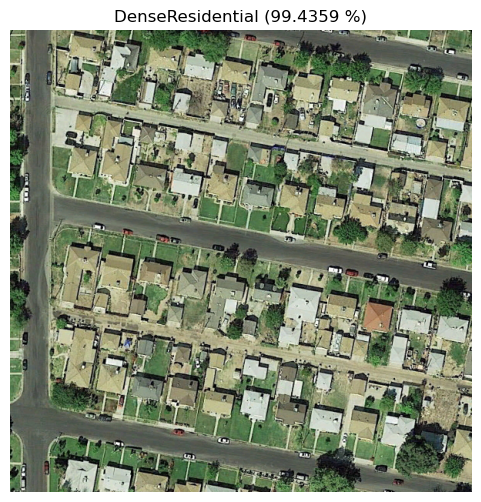

In [183]:
predict_image(test_image, model, show_image=True)

The provided code below performs several operations on an input test image using our trained model and the LimeImageExplainer for explanation generation.

First, the image is preprocessed by resizing it to (224, 224) pixels, converting it to a tensor, and applying normalization. The preprocessed image is then passed through the ResNet model to obtain the output predictions. The output tensor is converted to a numpy array for further processing. The input tensor is reshaped into a 2D color image format to be used as input for Lime explanations. Lime explanations are generated by calling the explain_instance() method with the input image, the trained model as a classifier function, and other parameters. The resulting explanation is stored for further analysis or visualization.

In [184]:
def explainer(test_img):
    """
    Generates Lime explanations for a test image using the
    LimeImageExplainer.

    Args:
        test_img (PIL.Image): The test image to generate explanations for.

    Returns:
        lime.base.Explanation: The Lime Explanation object containing the
        generated explanations.
    """
    # Preprocess the image
    test_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    test_img = test_transform(test_img)
    input_tensor = test_img.unsqueeze(0).to(device)

    # Perform the forward pass on the ResNet model
    with torch.no_grad():
        output = model(input_tensor)

    # Convert the PyTorch output tensor to a numpy array
    output_np = output.cpu().numpy()

    # Reshape the input tensor to a 2D color image format
    input_2d = np.transpose(input_tensor.squeeze().cpu().numpy(), (1, 2, 0))

    # Perform Lime explanations
    explainer = lime_image.LimeImageExplainer()
    exp = explainer.explain_instance(input_2d,
                                     classifier_fn=(lambda imgs:
                                                    model(torch.Tensor
                                                          (np.transpose
                                                    (imgs, (0, 3, 1, 2)))
                                                          .to(device))
                                                    .detach()
                                                    .cpu().numpy()),
                                     top_labels=5,
                                     hide_color=0,
                                     num_samples=1000)
    return exp

The following function loads the LIME explanations to variable named 'exp'.

In [185]:
exp = explainer(test_image)

  0%|          | 0/1000 [00:00<?, ?it/s]

We can also visualize the various explanation segments created by the LIME algorithm as shown in the figure below.

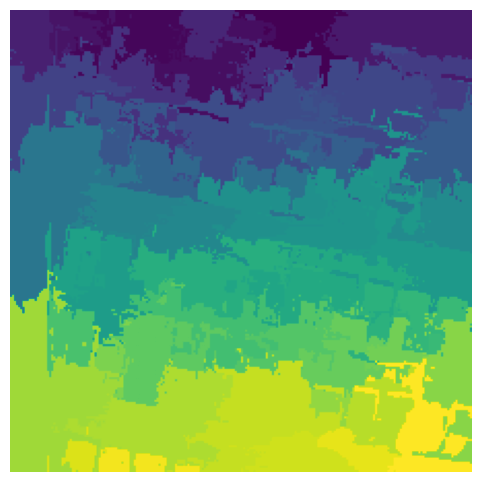

In [186]:
fig = plt.figure(figsize=(6, 6))
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

Next, we will leverage the top segments or super pixels to identify the specific region of interest within the image that the model relied on to make its prediction. By analyzing these selected segments, we can gain insights into the most influential areas that contributed to the model's decision-making process.

In [200]:
from io import BytesIO

def generate_prediction_sample(exp,
                               exp_class,
                               weight=0,
                               show_positive=True,
                               hide_background=True,
                               test_image=None):
    """
    Method to display and highlight super-pixels used by
    the black-box model to make predictions
    """
    # Generate the image and mask based on LIME explanations
    image, mask = exp.get_image_and_mask(exp_class,
                                     positive_only=show_positive,
                                     num_features=20,
                                     hide_rest=hide_background,
                                     min_weight=weight)
    
    # Get the original image without any processing applied
    original_image = test_image
    
    # Change the color of the boundary and outside area to gray
    # Set color=(0, 0, 0) for black, and outline_color=(0.5, 0.5, 0.5)
    # for gray
    boundaries = mark_boundaries(image,
                                 mask,
                                 color=(0, 0, 0),
                                 outline_color=(0.5, 0.5, 0.5))
    
    # Set boundary and outside area to gray (0.5), and keep other values
    gray_outside = np.where(boundaries == 0, 0.5, boundaries)  
    
    # Create a figure with two subplots: original image
    # and gray_outside image
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Display the original image
    axs[0].imshow(original_image)
    axs[0].axis('off')
    axs[0].set_title('Original Image')

    # Display the gray_outside image
    axs[1].imshow(gray_outside)
    axs[1].axis('off')
    if hide_background:
        axs[1].set_title('Superpixels Used by Model')
    else:
        axs[1].set_title('Superpixels Used by LIME')

    plt.tight_layout()
    
    # Save the plot as a PIL image
    img_buffer = BytesIO()
    plt.savefig(img_buffer, format='png')
    img_buffer.seek(0)
    result_image = Image.open(img_buffer)
    
    plt.close()
    
    return result_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


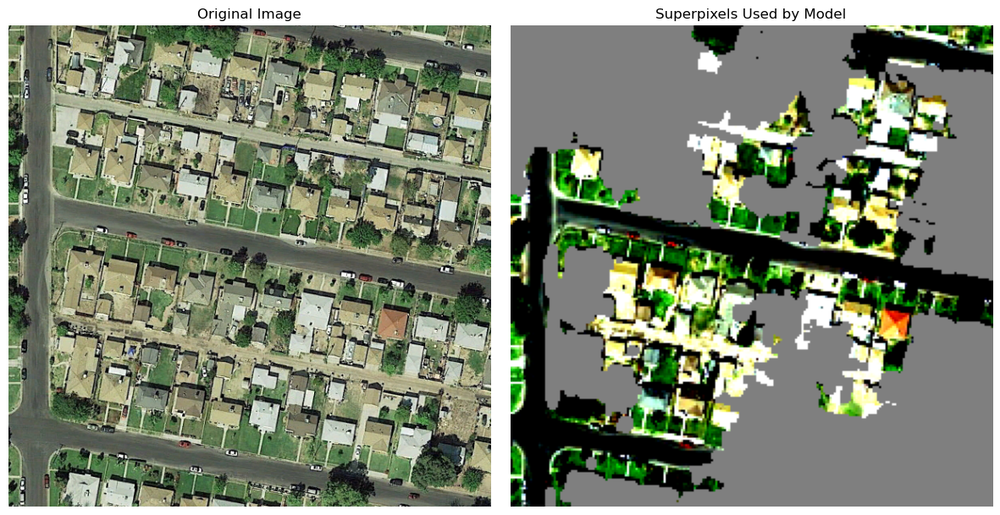

In [201]:
from skimage.segmentation import mark_boundaries

generate_prediction_sample(exp, exp.top_labels[0],
                           show_positive=True,
                           hide_background=True,
                           test_image=test_image)

As we can see from the above figure, the model is able to classify the image based on the above regions. We can notice that the model classifies the dense residential not only based on the regions where the houses are but also those region where the roads are.

On the other hand, in the image below, highlighted in green areas are the superpixels picked up by LIME to predict the output as DenseResidential. These areas are also called as positive superpixels.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


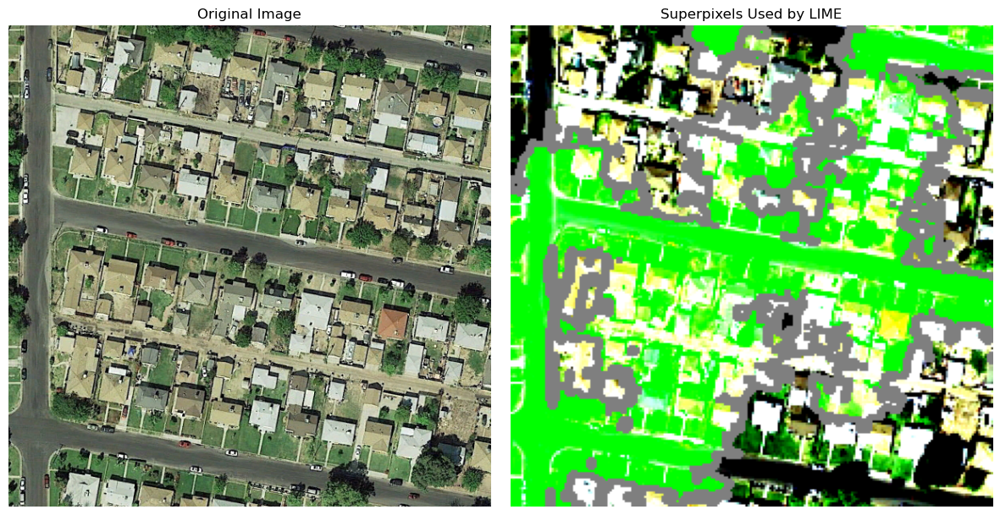

In [202]:
generate_prediction_sample(exp, exp.top_labels[0],
                           show_positive=False,
                           hide_background=False,
                           test_image=test_image)

We can see from the above images that the model heavily relies on the presence of nearby houses and roads to make predictions. However, it raises concerns about the model's ability to handle scenarios where road blockages occur, particularly during calamities. It is essential to assess the model's robustness and adaptability in such situations. Further investigation and experimentation are required to understand the model's performance limitations and explore strategies for enhancing its ability to handle road obstructions, ensuring reliable predictions in challenging real-world conditions.

We can also use a heatmap to highlight the regions in the image that the model used to assign the highest weights.

In [203]:
def explanation_heatmap(exp, exp_class, test_image):
    """
    Using heat-map to highlight the importance of each super-pixel
    for the model prediction
    """
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    
    # Create a figure with two subplots: original image and heatmap
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Display the original image
    axs[0].imshow(test_image)
    axs[0].axis('off')
    axs[0].set_title('Original Image')

    # Display the heatmap
    axs[1].imshow(heatmap, cmap='RdBu',
                  vmin=-heatmap.max(),
                  vmax=heatmap.max())
    axs[1].axis('off')
    axs[1].set_title('Heatmap')

    plt.tight_layout()
    
    # Save the plot as a PIL image
    img_buffer = BytesIO()
    plt.savefig(img_buffer, format='png')
    img_buffer.seek(0)
    heatmap_image = Image.open(img_buffer)
    
    plt.close()
    
    return heatmap_image

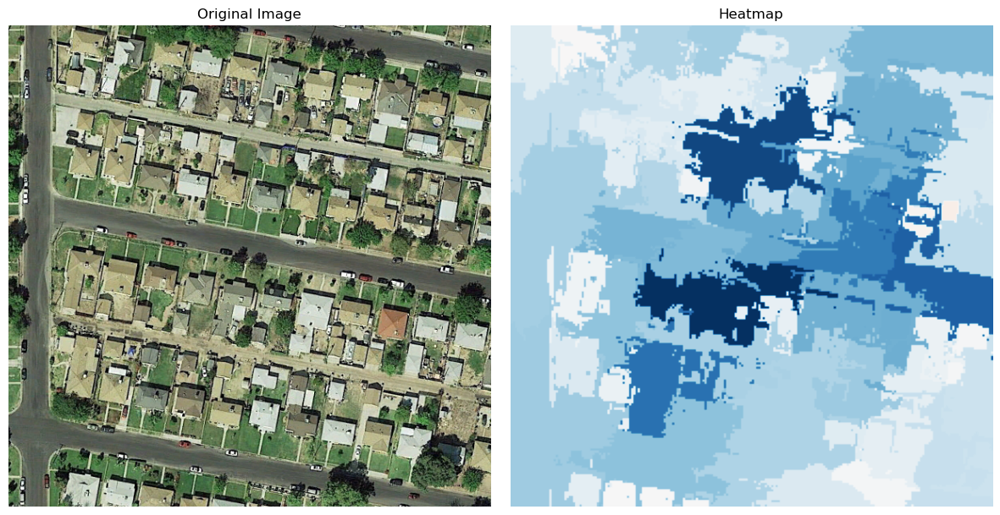

In [204]:
explanation_heatmap(exp, exp.top_labels[0], test_image)

We can from the images above the weights assigned by LIME to pixels. Those with the highest weight typically include pixels of houses in group and with parts of roads in them.

## Explanations Using Aerial Images During Calamities

We will also try to provide explanations to images that are not part of the test image dataset but are taken during calamities, for example, during flooding and try to generate explanations on how the model is able to provide explanations in these cases.

Accurate and reliable explanations on these types of aerial images are vital since it provides credibility to the model especially when using the model in making important decisions.

### Explanations for Flooded Dense Residential

In [168]:
img_fname = "flooded_residential_testimage.jpg"
test_image_flooded = Image.open(img_fname).resize([512, 512])

We can see from the image below that model is able to correctly classify this image despite flooded roads with a probability of 99%.

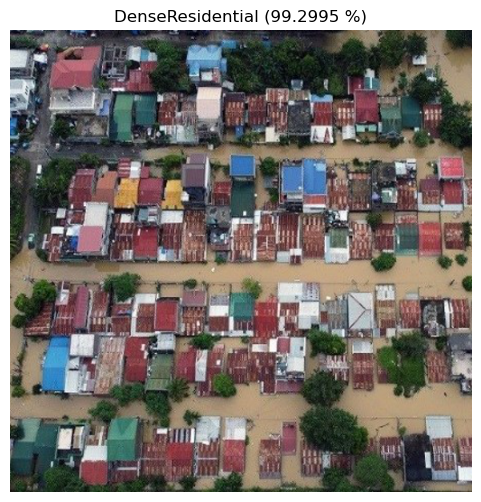

In [159]:
predict_image(test_image_flooded,
              model,
              show_image=True)

In [160]:
# Load LIME explanations
exp_flooded = explainer(test_image_flooded)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


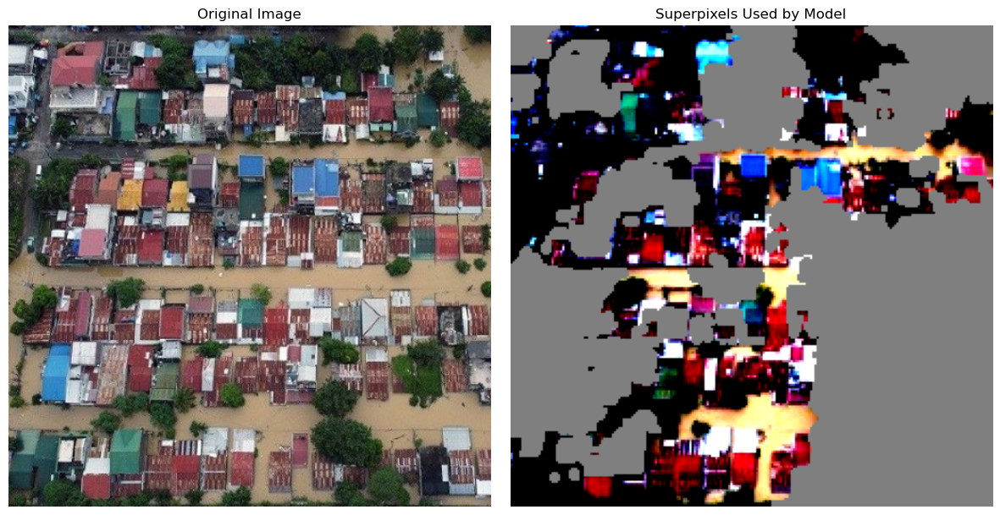

In [190]:
generate_prediction_sample(exp_flooded,
                           exp_flooded.top_labels[0],
                           show_positive=True,
                           hide_background=True,
                           test_image=test_image_flooded)

From the above resulting superpixel explanations, we can see that the model is able to use superpixels on residential houses in close proximity, some parts of the image with trees, and including some flooded areas. Notice as well that on the upper left part of the image, that the model is able to include pixels of the part of the image with the road that is not flooded. Through this, the image was correctly able to predict this image as a dense residential area.

### Explanations for Flooded Airport

In [170]:
img_fname = "flooded_airport.jpg"
test_image_floodedairport = Image.open(img_fname).resize([512, 512])

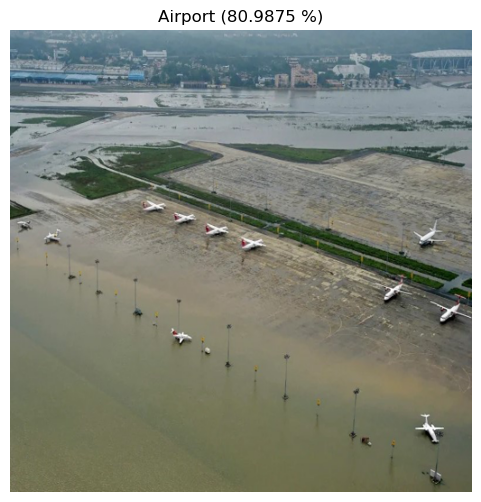

In [171]:
predict_image(test_image_floodedairport, model, show_image=True)

In [172]:
exp_floodedairport = explainer(test_image_floodedairport)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


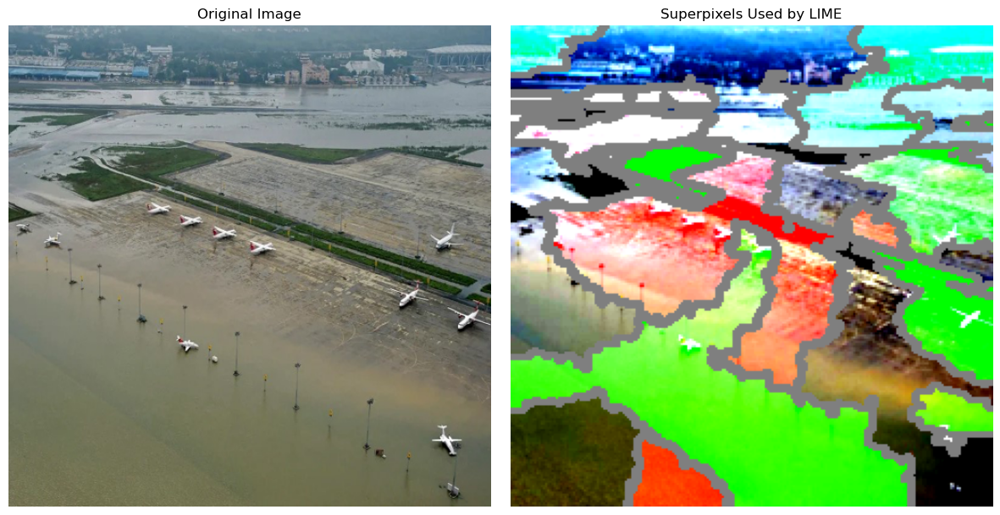

In [174]:
generate_prediction_sample(exp_floodedairport,
                           exp_floodedairport.top_labels[0],
                           show_positive=False,
                           hide_background=False,
                           test_image=test_image_floodedairport)

From the above explanations, we can see that the model is still able to predict that the image is an airport despite the presence of flood. The model is able to do this using superpixels that include not only the presence of airplanes but the presence of runways as highlighted in the left image.

### Explanations for a Forest Turned to Barren Land

One important use of our trained model is in classification of aerial scene images for monitoring for the effect of climate change. For example, in the image below, we can see an image of land cover that is used to be classified as a forest. But due to abrupt changes in climate and human causes, it is now being classified as a barren land. The model may be used for investigating these use cases. Any anomalies that may be generated may be used to call for a plan of action to concerned organizations.

In [176]:
img_fname = "leyte_landslide.jpg"
barren_land = Image.open(img_fname).resize([512, 512])

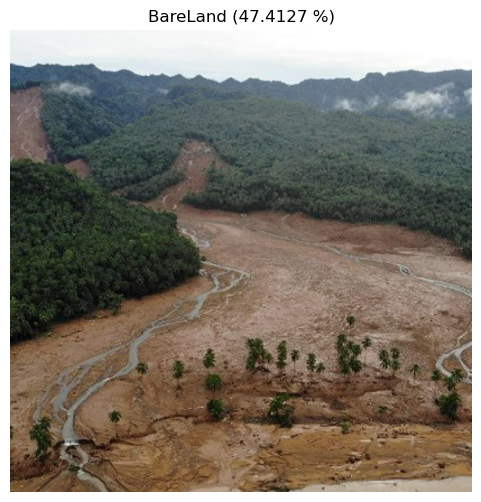

In [177]:
predict_image(barren_land, model, show_image=True)

In [178]:
exp_bareland = explainer(barren_land)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


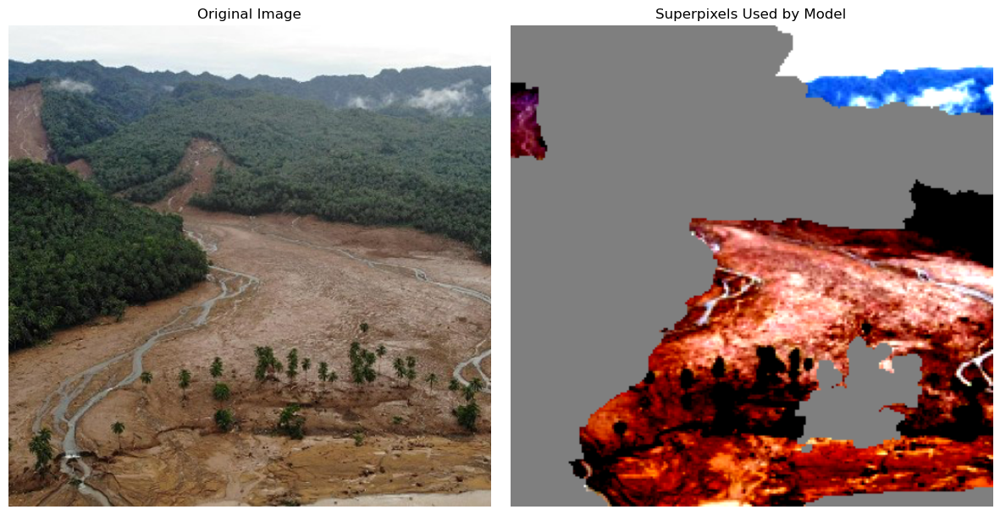

In [210]:
generate_prediction_sample(exp_bareland,
                           exp_bareland.top_labels[0],
                           show_positive=True,
                           hide_background=True,
                           test_image=barren_land)

The provided explanations reveal that the model predominantly relies on superpixels that cover a significant portion of the image, indicating the presence of bare land. This observation suggests that the model's decision-making process is primarily influenced by the extent of bare land within an image. 

# Model Inferencing Using Gradio App

Additionally, we developed a user-friendly web interface leveraging Gradio, simplifying the process of making predictions with our model. This interactive tool provides a seamless way to interact with the model, allowing users to input images and receive instant predictions with just a few clicks. The integration of Gradio enhances the accessibility and usability of our model, enabling a wider range of users to benefit from its capabilities without the need for extensive programming knowledge or technical expertise.

In [212]:
import gradio as gr
import warnings
warnings.filterwarnings("ignore")

def predict(input_image):
    # Convert Gradio image format to PIL image
    test_image = Image.fromarray(input_image)
    
    # Perform prediction and generate plots
    prediction = predict_image(test_image, model)
    exp = explainer(test_image)
    image1 = generate_prediction_sample(exp, exp.top_labels[0],
                                        show_positive=True,
                                        hide_background=True)
    image2 = generate_prediction_sample(exp, exp.top_labels[0],
                                        show_positive=False,
                                        hide_background=False)
    image3 = explanation_heatmap(exp, exp.top_labels[0])
    
    return [f"Prediction: {prediction}", image1, image2, image3]

# Define Gradio interface with text instructions
inputs = gr.inputs.Image()
outputs = [gr.outputs.Textbox(label="Model Prediction"),
           gr.outputs.Image(label="Superpixels Used by Model",
                            type="pil"), 
           gr.outputs.Image(label="Superpixels Used by LIME",
                            type="pil"), 
           gr.outputs.Image(label="LIME's Pixels Weight Assignment",
                            type="pil")]

title = "Superpixel Insights for Aerial Image Classification (SIFAIC)"
description = "This interface uses LIME (Local Interpretable Model-agnostic Explanations) to identify the most important superpixels contributing to the model's prediction.\n\nPlease use aerial scenic images from Google Earth in JPEG or JPG format, with a size of 600 x 600 pixels for better model accuracy.\n\nThe supported class list for images includes:\n\nAirport, BareLand, BaseballField, Beach, Bridge, Center, Church, Commercial, DenseResidential, Desert,\nFarmland, Forest, Industrial, Meadow, MediumResidential, Mountain, Park, Parking, Playground, Pond,\nPort, RailwayStation, Resort, River, School, SparseResidential, Square, Stadium, StorageTanks, Viaduct.\n\nEnjoy! :)"

gr_interface = gr.Interface(fn=predict, inputs=inputs, outputs=outputs, title=title, description=description)
gr_interface.launch(share=True)

Running on local URL:  http://127.0.0.1:7866
Running on public URL: https://22f693c52b77ec6bfa.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


Here is a snapshot of how the web interface appears.

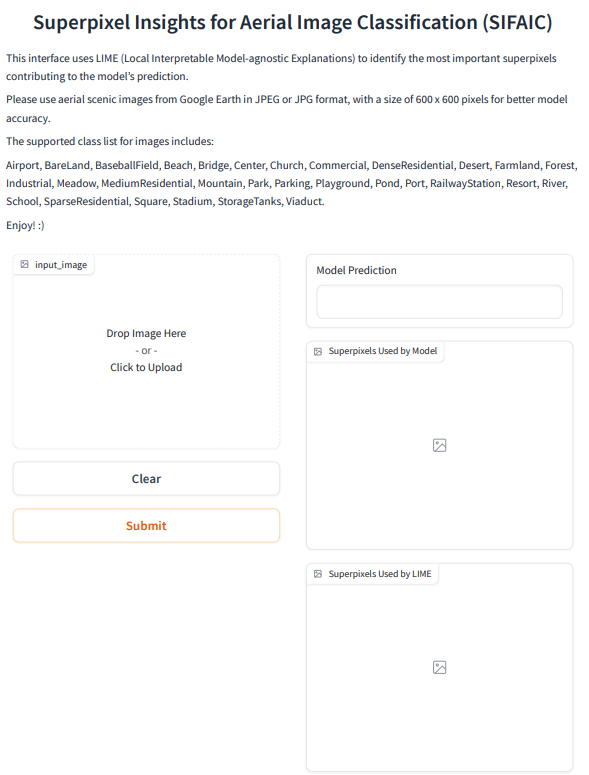

# Conclusion

In summary, this article demonstrates the effectiveness of LIME in providing valuable insights for explaining an image classification model. The insights gained through LIME enable a deeper understanding of the model's decision-making process, highlighting the important features and patterns it considers for predictions. By incorporating LIME to a deep learning model, we can not only achieve highly accurare model in terms of numbers but also enhance their interpretability. This becomes particularly useful in applications where transparency and explainability are crucial requirements. LIME empowers us to unlock the black box nature of complex models and promote trust, accountability, and further improvements in AI systems.

Thank you for reading! I hope you learned something interesting! :)

# References

- Bhattacharya, A. (2022, August 15). How to Explain Image Classifiers Using LIME. Retrieved from https://towardsdatascience.com/how-to-explain-image-classifiers-using-lime-e364097335b4
- Ribeiro, M. T., Singh, S., & Guestrin, C. (2016). "Why Should I Trust You?": Explaining the Predictions of Any Classifier. arXiv preprint arXiv:1602.04938 [cs.LG]. Retrieved from https://doi.org/10.48550/arXiv.1602.04938
- Velázquez, T. M. G., & Azuela, J. H. S. (2021). New Explainability Method based on the Classification of Useful Regions in an Image. Comp. y Sist., 25(4). doi:10.13053/cys-25-4-4049
- Xia, G., Hu, J., Hu, F., Shi, B., Bai, X., Zhong, Y., & Zhang, L. (2017). AID: A Benchmark Dataset for Performance Evaluation of Aerial Scene Classification. IEEE Transactions on Geoscience and Remote Sensing, 55(7), 3965-3981.